In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import color
from skimage.io import imread

In [4]:
tomato_1 = cv2.imread('/Users/taojing/Desktop/image_classification/images/segmented_dishes/tomato_egg/segmented_dish_9642_0.jpg')
# tomato = tomato_egg.astype(np.float32) / 255.0
tomato_2 = cv2.imread('images/segmented_dishes/tomato_egg/segmented_dish_9645_2.jpg')

sh_green1 = cv2.imread('images/segmented_dishes/shanghai_green/segmented_dish_8987_0.jpg')

sh_green2 = cv2.imread('images/segmented_dishes/shanghai_green/segmented_dish_8988_0.jpg')


purple_rice1 = cv2.imread('')

In [5]:
# detect keypoints and descriptors with SIFT
base_gray = np.uint8(color.rgb2gray(tomato_1)*255)
descriptor = cv2.SIFT_create()
keypoints, descriptors = descriptor.detectAndCompute(base_gray, None)


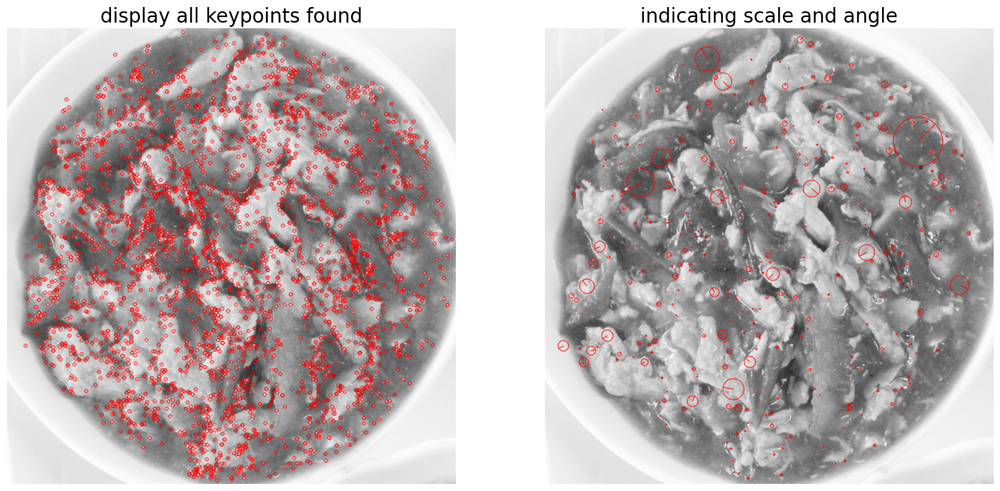

In [6]:
plt.figure(figsize=(18,10))

plt.subplot(121)
plt.imshow(cv2.drawKeypoints(base_gray, keypoints, None, 
                             color=(255,0,0)))
plt.axis('off')
plt.title('display all keypoints found', fontsize=20)

plt.subplot(122)
keypoints_reduced = keypoints[0:len(keypoints):10]
plt.imshow(cv2.drawKeypoints(base_gray, keypoints_reduced, None, 
                             color=(255,0,0),
                             flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS))
plt.axis('off')
plt.title('indicating scale and angle', fontsize=20)

plt.show()

In [7]:
# keypoints of tomato_2
base_gray_2= np.uint8(color.rgb2gray(tomato_2)*255)
keypoints_2, descriptors_2 = descriptor.detectAndCompute(base_gray_2, None)

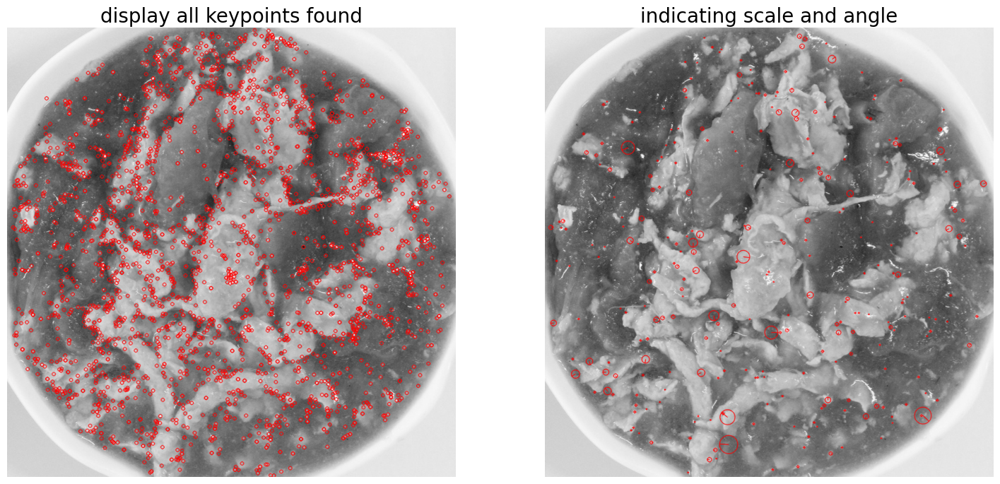

In [8]:
# show the keypoints of tomato_2
plt.figure(figsize=(18,10))

plt.subplot(121)
plt.imshow(cv2.drawKeypoints(base_gray_2, keypoints_2, None, 
                             color=(255,0,0)))
plt.axis('off')
plt.title('display all keypoints found', fontsize=20)

plt.subplot(122)
keypoints_reduced = keypoints_2[0:len(keypoints_2):10]
plt.imshow(cv2.drawKeypoints(base_gray_2, keypoints_reduced, None, 
                             color=(255,0,0),
                             flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS))
plt.axis('off')
plt.title('indicating scale and angle', fontsize=20)

plt.show()

In [10]:
# matching points based on their distance
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)


matches = bf.match(descriptors,descriptors_2)
print("number of matches (Brute force):", len(matches))

# Sort the features in order of distance.
# The points with small distance (more similarity) are ordered first in the vector
sorted_matches = sorted(matches, key = lambda x:x.distance)

for k in np.arange(0,10):
    print('keypoints {} (base) and {} (query) have a feature space distance of {:.2f}'.format(
     sorted_matches[k].trainIdx, sorted_matches[k].queryIdx, sorted_matches[k].distance))

number of matches (Brute force): 950
keypoints 1181 (base) and 251 (query) have a feature space distance of 112.77
keypoints 2115 (base) and 136 (query) have a feature space distance of 123.56
keypoints 554 (base) and 586 (query) have a feature space distance of 129.50
keypoints 478 (base) and 732 (query) have a feature space distance of 130.54
keypoints 2082 (base) and 1781 (query) have a feature space distance of 134.67
keypoints 1535 (base) and 1073 (query) have a feature space distance of 137.11
keypoints 2441 (base) and 1485 (query) have a feature space distance of 140.17
keypoints 149 (base) and 3262 (query) have a feature space distance of 143.90
keypoints 319 (base) and 252 (query) have a feature space distance of 145.27
keypoints 1130 (base) and 2009 (query) have a feature space distance of 148.20


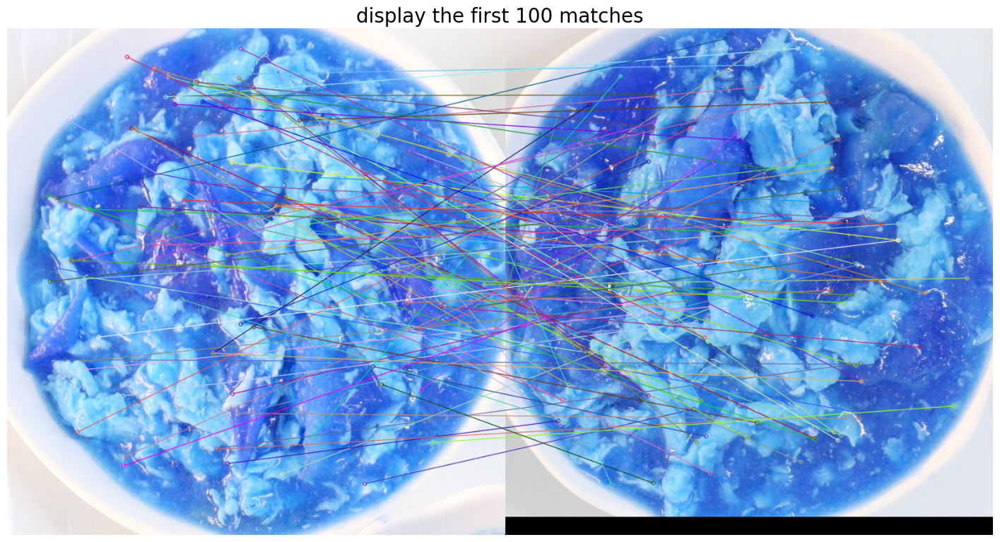

In [11]:
# show the first 100 matches
plt.figure(figsize=(18,10))
plt.imshow(cv2.drawMatches(tomato_1, keypoints, tomato_2, keypoints_2, sorted_matches[:100], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS))
plt.axis('off')
plt.title('display the first 100 matches', fontsize=20)
plt.show()


***The difference calculated with L2 norm is apparently not satisfactory***

In [16]:
# try flann clutering-based matcher
# find matches 
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(descriptors,descriptors_2,k=2)
# show match ratio

len(matches)

total = len(descriptors) + len(descriptors_2) 

ratio  = len(matches)/total

print(ratio)


0.5427909286541963


In [17]:
# matching ratio

avg_total = (len(descriptors) + len(descriptors_2)) 
print("Average total descriptors: {:.2f}".format(avg_total))
print("Number of matches: {:.2f}".format(len(matches)))
match_ratio = len(matches)/avg_total
print(match_ratio)

Average total descriptors: 6041.00
Number of matches: 3279.00
0.5427909286541963


In [18]:
# compute the matching ratio of the little green

base_gray_3 = np.uint8(color.rgb2gray(sh_green1)*255)
keypoints_3, descriptors_3 = descriptor.detectAndCompute(base_gray_3, None)

# compute the matching ratio of the tomato_1 with little green


# compute the matching ratio
total = (len(descriptors) + len(descriptors_3)) /2  
print("Average total descriptors: {:.2f}".format(total))
matches = bf.match(descriptors,descriptors_3)
print("number of matches (Brute force):", len(matches))

match_ratio = len(matches)/total
print(match_ratio)

Average total descriptors: 3201.50
number of matches (Brute force): 928
0.28986412619084806


Text(0.5, 1.0, 'indicating scale and angle')

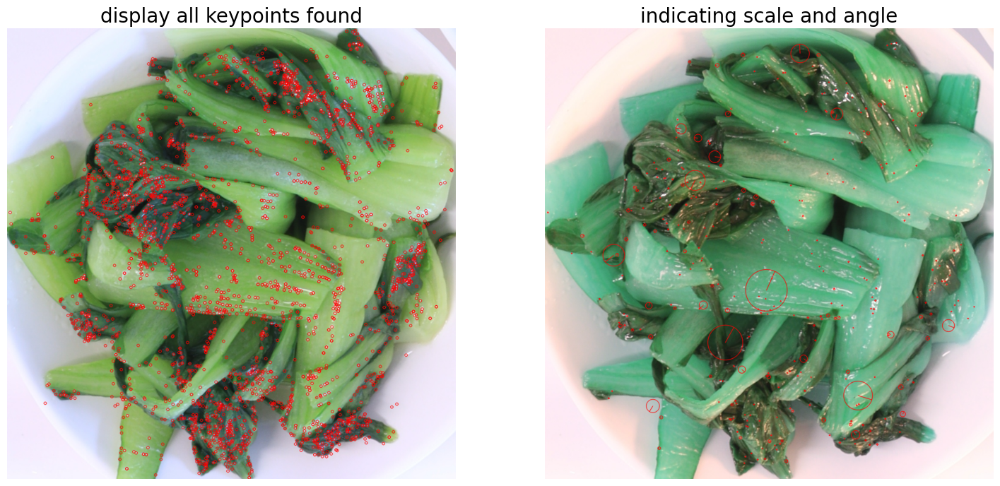

In [29]:
plt.figure(figsize=(18,10))

plt.subplot(121)
plt.imshow(cv2.drawKeypoints(cv2.cvtColor(sh_green1, cv2.COLOR_BGR2RGB), keypoints_3, None, color=(255,0,0)))
plt.axis('off')
plt.title('display all keypoints found', fontsize=20)

plt.subplot(122)
keypoints_reduced = keypoints_3[0:len(keypoints):10]
plt.imshow(cv2.drawKeypoints(sh_green1, keypoints_reduced, None, 
                             color=(255,0,0),
                             flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS))
plt.axis('off')
plt.title('indicating scale and angle', fontsize=20)


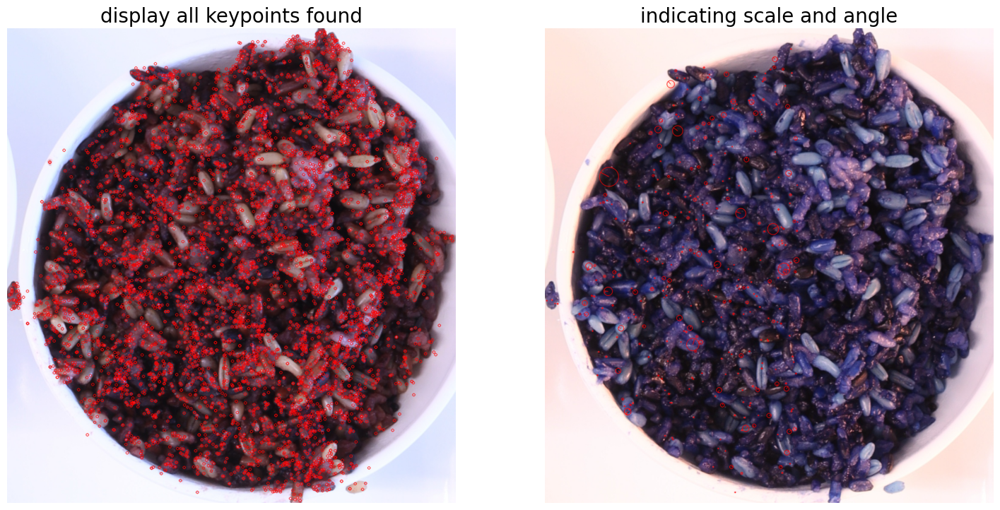

In [27]:
purple_rice = cv2.imread('images/segmented_dishes/purple_rice/segmented_dish_8977_3.jpg')
base_gray_4 = np.uint8(color.rgb2gray(purple_rice)*255)
keypoints_4, descriptors_4 = descriptor.detectAndCompute(base_gray_4, None)

# draw the keypoints of purple rice
plt.figure(figsize=(18,10))

plt.subplot(121)
plt.imshow(cv2.drawKeypoints(cv2.cvtColor(purple_rice, cv2.COLOR_BGR2RGB), keypoints_4, None, 
                             color=(255,0,0)))
# show with cvtcolor
# plt.imshow(cv2.drawKeypoints(cv2.cvtColor(purple_rice, cv2.COLOR_BGR2GRAY), keypoints_4, None,
plt.axis('off')
plt.title('display all keypoints found', fontsize=20)

plt.subplot(122)
keypoints_reduced = keypoints_4[0:len(keypoints):10]
plt.imshow(cv2.drawKeypoints(purple_rice, keypoints_reduced, None, 
                             color=(255,0,0),
                             flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS))
plt.axis('off')
plt.title('indicating scale and angle', fontsize=20)

plt.show()


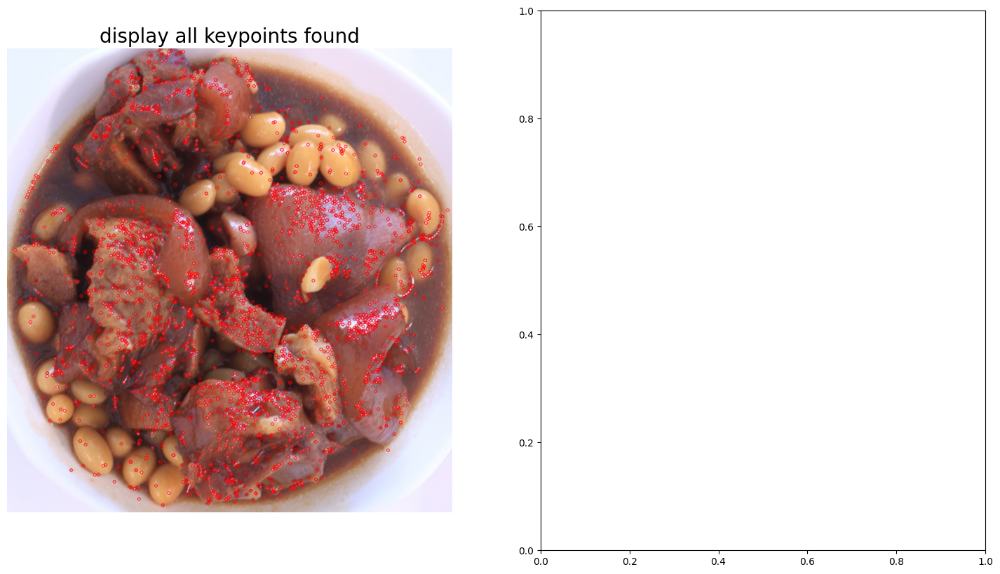

In [26]:
img4 = cv2.imread('images/segmented_dishes/pork_leg/segmented_dish_8872_0.jpg')
base_gray_5 = np.uint8(color.rgb2gray(img4)*255)
keypoints_5, descriptors_5 = descriptor.detectAndCompute(base_gray_5, None)

# draw the keypoints of purple rice
plt.figure(figsize=(18,10))
plt.subplot(121)

# show with cvtcolor
plt.imshow(cv2.drawKeypoints(cv2.cvtColor(img4, cv2.COLOR_BGR2RGB), keypoints_5, None, 
                             color=(255,0,0)))
plt.axis('off')
plt.title('display all keypoints found', fontsize=20)

plt.subplot(122)
keypoints_reduced = keypoints_5[0:len(keypoints):10]


***load 4 categories of dishes***

In [20]:
# make training set a dictionary of data, label
# initiate a empty nDarray

training_set = {'data':[], 'label':[]}



# load all images from /Users/taojing/Desktop/image_classification/images/categorized_dishes/tomato_egg
for file in os.listdir('images/categorized_dishes/tomato_egg'):
    if file.endswith('.jpg'):
        # read the image as data, add label
        training_set['data'].append(imread('images/categorized_dishes/tomato_egg/'+file))
        training_set['label'].append('tomato_egg')

for file in os.listdir('images/categorized_dishes/cucumber_egg'):
    if file.endswith('.jpg'):
        training_set['data'].append(imread('images/categorized_dishes/cucumber_egg/'+file))
        training_set['label'].append('cucumber_egg')
for file in os.listdir('images/categorized_dishes/purple_rice'):
    if file.endswith('.jpg'):
        training_set['data'].append(imread('images/categorized_dishes/purple_rice/'+file))
        training_set['label'].append('purple_rice')
for file in os.listdir('images/categorized_dishes/little_greens'):
    if file.endswith('.jpg'):
        training_set['data'].append(imread('images/categorized_dishes/little_greens/'+file))
        training_set['label'].append('little_greens')






       



In [ ]:
import random

# Shuffle the data and labels simultaneously
combined = list(zip(training_set['data'], training_set['label']))
random.shuffle(combined)

# Unzip the shuffled data and labels
shuffled_data, shuffled_labels = zip(*combined)

# Update the training_set dictionary with shuffled data and labels
training_set['data'] = list(shuffled_data)
training_set['label'] = list(shuffled_labels)

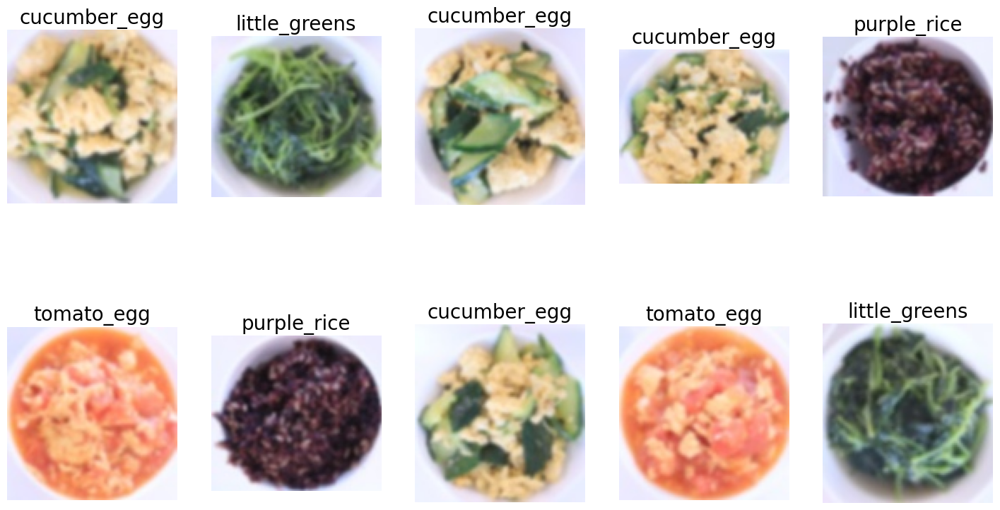

In [ ]:
# show the first 10 images
plt.figure(figsize=(18,10))

for i in range(10):
    plt.subplot(2,5,i+1)
    plt.imshow(training_set['data'][i])
    plt.axis('off')
    plt.title(training_set['label'][i], fontsize=20)
plt.show()


In [ ]:
# extract keypoints from each image
training_set['keypoints'] = []
training_set['descriptors'] = []

for img in training_set['data']:
    gray = np.uint8(color.rgb2gray(img)*255)
    kp, des = descriptor.detectAndCompute(gray, None)
    training_set['keypoints'].append(kp)
    training_set['descriptors'].append(des)

    

In [ ]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.neural_network import MLPClassifier

In [ ]:
k = 40
batch_size = 64

# initiate a MiniBatchKMeans object
kmeans = MiniBatchKMeans(n_clusters=k, batch_size=batch_size)

# concatenate all descriptors into a single array
all_descriptors = np.concatenate(training_set['descriptors'])

# fit the kmeans model
kmeans.fit(all_descriptors)


MiniBatchKMeans(batch_size=64, n_clusters=40)

In [ ]:
# compute histograms for each image
training_set['histograms'] = []

for des in training_set['descriptors']:
    # predict the cluster index for each descriptor
    clusters = kmeans.predict(des)
    # compute the histogram
    hist, _ = np.histogram(clusters, bins=np.arange(k+1))
    training_set['histograms'].append(hist)
    

In [ ]:
# i want to make the training input as a 2D array, so the first dimention is the sift histogram, and the second dimension is the color histogram
# compute the color histogram for each image
training_set['color_histograms'] = []

for img in training_set['data']:
    # convert the image to HSV
    hsv = color.rgb2hsv(img)
    # compute the histogram
    hist, _ = np.histogram(hsv[:,:,0], bins=np.arange(10))
    training_set['color_histograms'].append(hist)


In [ ]:
# concatenate the sift histograms and color histograms

X =  np.concatenate([training_set['histograms'], training_set['color_histograms']], axis=1)
y = training_set['label']
# split the data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# train a random forest classifier
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# evaluate the classifier
from sklearn.metrics import accuracy_score
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print('accuracy:', accuracy)


accuracy: 1.0


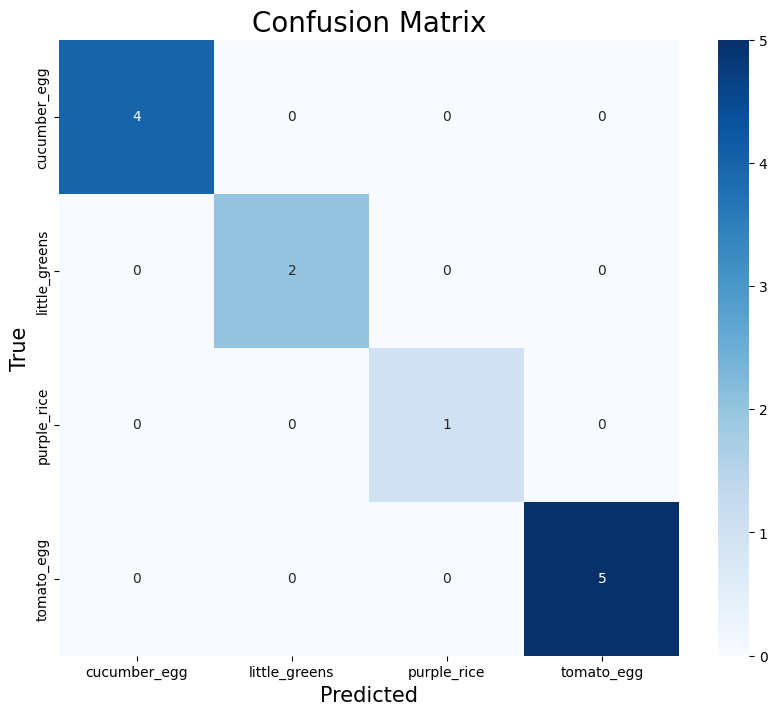

In [ ]:
# show the confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,8))

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['cucumber_egg', 'little_greens', 'purple_rice', 'tomato_egg'], yticklabels=['cucumber_egg', 'little_greens', 'purple_rice', 'tomato_egg'])
plt.xlabel('Predicted', fontsize=15)
plt.ylabel('True', fontsize=15)
plt.title('Confusion Matrix', fontsize=20)
plt.show()


In [ ]:
#  train a SVM
from sklearn.svm import SVC
clf = SVC(kernel='linear')
clf.fit(X_train, y_train)

# evaluate the classifier
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print('accuracy:', accuracy)



accuracy: 0.9166666666666666


In [ ]:
# training a neural network
clf = MLPClassifier(hidden_layer_sizes=(256, 128), max_iter=1000)

# fit the model

clf.fit(X_train, y_train)

# evaluate the model
accuracy = clf.score(X_test, y_test)
print('accuracy:', accuracy)

accuracy: 0.3333333333333333


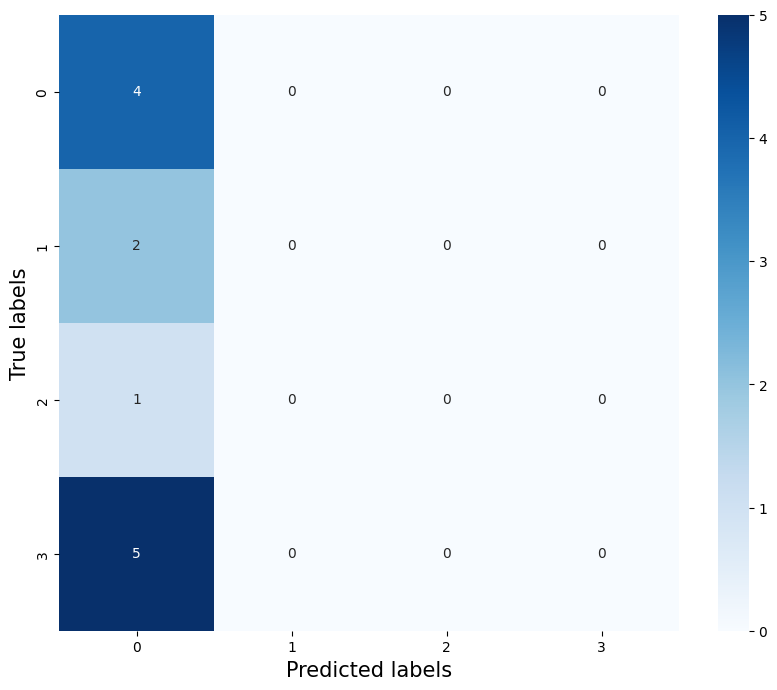

In [ ]:
# show the confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred = clf.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels', fontsize=15)
plt.ylabel('True labels', fontsize=15)
plt.show()
